In [1]:
%load_ext autoreload
%autoreload 2

In [3]:
from craftax.craftax_env import make_craftax_env_from_name
import jax
import numpy as np
import jax.numpy as jnp
from functools import partial
import matplotlib.pyplot as plt
from craftax.craftax.constants import Action

from simulations.craftax_web_env import CraftaxSymbolicWebEnvNoAutoReset
from jaxneurorl.wrappers import TimestepWrapper
from craftax_fullmap_renderer import render_craftax_pixels, TEXTURES

import craftax_fullmap_constants as constants
import craftax_utils
import craftax_experiment_configs
from craftax.craftax.constants import Achievement, BlockType, BLOCK_PIXEL_SIZE_HUMAN

Loading textures from cache.
Textures successfully loaded from cache.


In [4]:
MONSTERS = 1
DEBUG = 0

WORLD_SEED = 1
static_env_params = CraftaxSymbolicWebEnvNoAutoReset.default_static_params()
static_env_params = static_env_params.replace(
  max_melee_mobs=MONSTERS,
  max_ranged_mobs=MONSTERS,
  max_passive_mobs=10,  # cows
  initial_crafting_tables=True,
  initial_strength=20,
  map_size=(48, 48),
)
jax_env = CraftaxSymbolicWebEnvNoAutoReset(
  static_env_params=static_env_params,
)
default_params = jax_env.default_params.replace(
  day_length=100000,
  mob_despawn_distance=100000,
  world_seeds=(WORLD_SEED,),
)
key = jax.random.PRNGKey(0)

In [17]:
def get_block_locations(world_seed, blocks, state=None):
  for block in blocks:
    if state is None:
      params = default_params.replace(
        world_seeds=(world_seed,),
      )
      obs, state = jax_env.reset(key, params)
    locations = craftax_utils.get_object_positions(state, block)
    print(f"{block.name} locations: {locations}")

# 2 paths (single location)

DIAMOND locations: [[37 47]]
CRAFTING_TABLE locations: [[38 42]
 [42 46]]
IRON locations: [[38 20]
 [35 13]
 [ 7 20]
 [12 39]
 [40 39]
 [40  7]
 [ 6  2]
 [ 4  3]
 [ 1  4]]
Loading path from cache: craftax_cache/paths/world_3_path_(28, 25)_(35, 13).npy
Loading path from cache: craftax_cache/paths/world_3_path_(28, 25)_(37, 47).npy
Loading path from cache: craftax_cache/paths/world_3_path_(28, 25)_(39, 44).npy
Saved to craftax_cache/single/world_3_paths.png


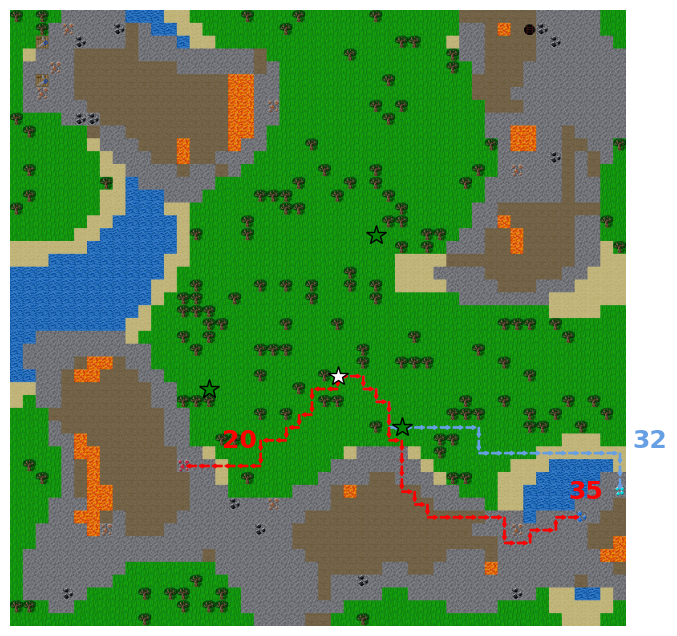

In [59]:
world_seed = 3
start_position = (28, 25)

get_block_locations(
  world_seed, blocks=[BlockType.DIAMOND, BlockType.CRAFTING_TABLE, BlockType.IRON]
)
train_object = BlockType.SAPPHIRE
train_object_location = (39, 44)  # replacing old diamond location

train_distractor_object = BlockType.RUBY
train_distractor_object_location = (35, 13)

test_object = BlockType.DIAMOND
test_object_location = (37, 47)


craftax_utils.train_test_paths(
  jax_env=jax_env,
  params=default_params,
  world_seed=world_seed,
  start_position=start_position,
  train_object=train_object,
  train_distractor_object=train_distractor_object,
  test_object=test_object,
  train_object_location=train_object_location,
  train_distractor_object_location=train_distractor_object_location,
  test_object_location=test_object_location,
  prefix="single",
  extra_start_positions_rng=jax.random.PRNGKey(42),
  extra_start_position_center=(20, 24),
  extra_positions=[(32, 30), (17, 28), (29, 15)],
  # extra_start_positions=3,
)
# get_block_locations(
#     world_seed,
#     blocks=[BlockType.DIAMOND, BlockType.SAPPHIRE, BlockType.RUBY],
#     state=state,
#     )

DIAMOND locations: [[42 45]]
CRAFTING_TABLE locations: [[38 46]
 [45 46]]
IRON locations: [[23 13]
 [10 31]
 [44 38]
 [46 36]
 [47 40]]
Loading path from cache: craftax_cache/paths/world_15_path_(24, 24)_(37, 13).npy
Loading path from cache: craftax_cache/paths/world_15_path_(24, 24)_(38, 46).npy
Loading path from cache: craftax_cache/paths/world_15_path_(24, 24)_(41, 44).npy
Saved to craftax_cache/single/world_15_paths.png


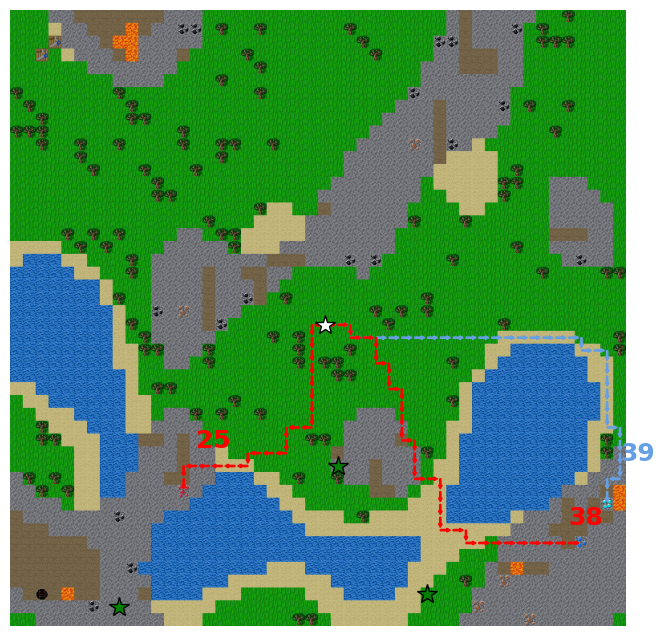

In [61]:
world_seed = 15
# start_position=(22, 25)
start_position = None
get_block_locations(
  world_seed, blocks=[BlockType.DIAMOND, BlockType.CRAFTING_TABLE, BlockType.IRON]
)
train_object = BlockType.SAPPHIRE
train_object_location = (41, 44)  # replacing old diamond location

train_distractor_object = BlockType.RUBY
train_distractor_object_location = (37, 13)

test_object = BlockType.DIAMOND
test_object_location = (38, 46)


craftax_utils.train_test_paths(
  jax_env=jax_env,
  params=default_params,
  world_seed=world_seed,
  start_position=start_position,
  train_object=train_object,
  train_distractor_object=train_distractor_object,
  test_object=test_object,
  train_object_location=train_object_location,
  train_distractor_object_location=train_distractor_object_location,
  test_object_location=test_object_location,
  prefix="single",
  extra_start_positions_rng=jax.random.PRNGKey(42),
  extra_start_position_center=(20, 25),
  extra_positions=craftax_experiment_configs.PATHS_CONFIGS[1].start_train_positions,
)
# get_block_locations(
#     world_seed,
#     blocks=[BlockType.DIAMOND, BlockType.SAPPHIRE, BlockType.RUBY],
#     state=state,
#     )

DIAMOND locations: [[43 29]]
CRAFTING_TABLE locations: [[38 32]
 [40 32]]
IRON locations: [[36 14]
 [40 28]
 [41 26]
 [ 8  3]]
Loading path from cache: craftax_cache/paths/world_20_path_(18, 30)_(13, 13).npy
Loading path from cache: craftax_cache/paths/world_20_path_(18, 30)_(40, 32).npy
Loading path from cache: craftax_cache/paths/world_20_path_(18, 30)_(42, 30).npy
Saved to craftax_cache/single/world_20_paths.png


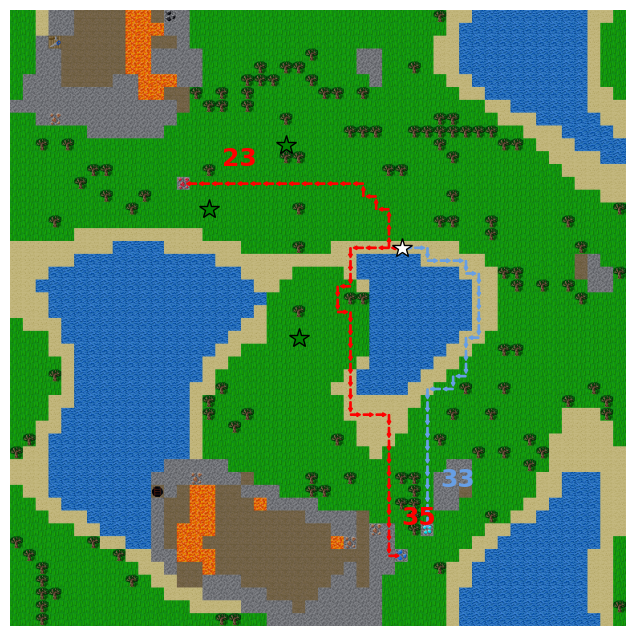

In [64]:
world_seed = 20
start_position = (18, 30)
# start_position = None
get_block_locations(
  world_seed, blocks=[BlockType.DIAMOND, BlockType.CRAFTING_TABLE, BlockType.IRON]
)
train_object = BlockType.SAPPHIRE
train_object_location = (42, 30)  # replacing old diamond location

train_distractor_object = BlockType.RUBY
train_distractor_object_location = (13, 13)

test_object = BlockType.DIAMOND
test_object_location = (40, 32)


craftax_utils.train_test_paths(
  jax_env=jax_env,
  params=default_params,
  world_seed=world_seed,
  start_position=start_position,
  train_object=train_object,
  train_distractor_object=train_distractor_object,
  test_object=test_object,
  train_object_location=train_object_location,
  train_distractor_object_location=train_distractor_object_location,
  test_object_location=test_object_location,
  prefix="single",
  extra_start_positions_rng=jax.random.PRNGKey(42),
  extra_start_position_center=(20, 25),
  extra_positions=craftax_experiment_configs.PATHS_CONFIGS[2].start_train_positions,
)
# get_block_locations(
#     world_seed,
#     blocks=[BlockType.DIAMOND, BlockType.SAPPHIRE, BlockType.RUBY],
#     state=state,
#     )

DIAMOND locations: [[ 3 36]]
CRAFTING_TABLE locations: [[ 6 34]
 [ 6 38]]
IRON locations: [[26 40]
 [ 8 29]
 [28 41]
 [23 42]
 [24 45]
 [ 4 33]
 [14 44]
 [28 46]
 [ 2 40]]
Loading path from cache: craftax_cache/paths/world_95_path_(7, 16)_(17, 13).npy
Loading path from cache: craftax_cache/paths/world_95_path_(7, 16)_(6, 34).npy
Loading path from cache: craftax_cache/paths/world_95_path_(7, 16)_(3, 36).npy
Saved to craftax_cache/single/world_95_paths.png


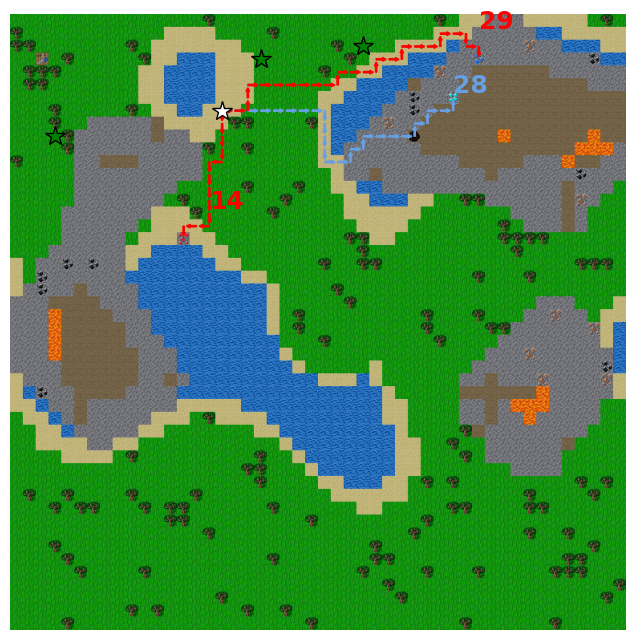

In [67]:
world_seed = 95
start_position = (7, 16)

get_block_locations(
  world_seed, blocks=[BlockType.DIAMOND, BlockType.CRAFTING_TABLE, BlockType.IRON]
)
train_object = BlockType.SAPPHIRE
train_object_location = (3, 36)  # replacing old diamond location

train_distractor_object = BlockType.RUBY
train_distractor_object_location = (17, 13)

test_object = BlockType.DIAMOND
test_object_location = (6, 34)


craftax_utils.train_test_paths(
  jax_env=jax_env,
  params=default_params,
  world_seed=world_seed,
  start_position=start_position,
  train_object=train_object,
  train_distractor_object=train_distractor_object,
  test_object=test_object,
  train_object_location=train_object_location,
  train_distractor_object_location=train_distractor_object_location,
  test_object_location=test_object_location,
  prefix="single",
  extra_start_positions_rng=jax.random.PRNGKey(42),
  extra_start_position_center=(20, 25),
  extra_positions=craftax_experiment_configs.PATHS_CONFIGS[3].start_train_positions,
)
# get_block_locations(
#     world_seed,
#     blocks=[BlockType.DIAMOND, BlockType.SAPPHIRE, BlockType.RUBY],
#     state=state,
#     )

A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/paths/world_2_path_(34, 10)_(34, 27).npy


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/paths/world_2_path_(34, 10)_(41, 29).npy
path length: 18
path length: 27
Loading path from cache: craftax_cache/paths/world_2_path_(34, 10)_(41, 8).npy
Loading path from cache: craftax_cache/paths/world_2_path_(34, 10)_(37, 28).npy
path length: 20
path length: 24
Saved to craftax_cache/double/world_2_paths.png


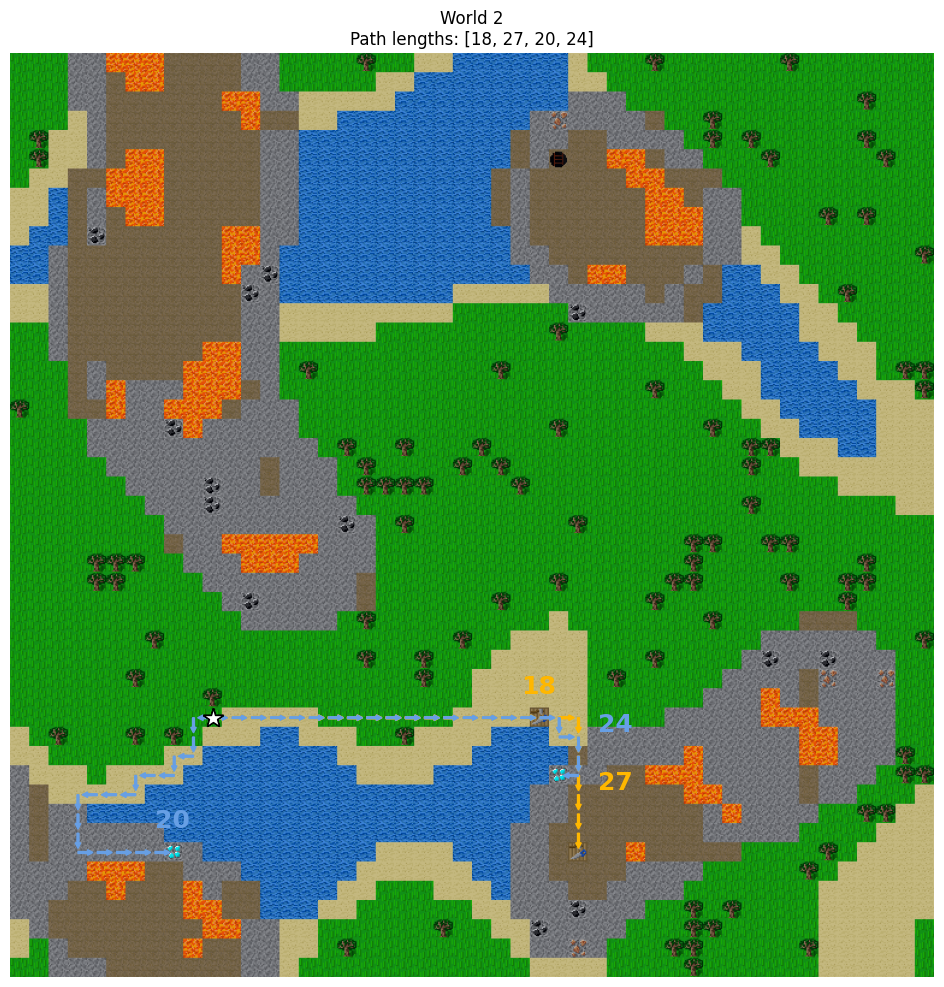

In [40]:
world_seed = 2
start_position = (34, 10)
# start_position = None
with jax.disable_jit():
  craftax_utils.train_test_paths(
    jax_env=jax_env,
    params=default_params,
    world_seed=world_seed,
    start_position=start_position,
    train_object=BlockType.CRAFTING_TABLE,
    test_object=BlockType.DIAMOND,
    prefix="double",
    nearby_goal=False,
    extra_start_positions_rng=jax.random.PRNGKey(42),
    extra_start_position_center=(1, 15),
  )

A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_2_path_(46, 18)_(41, 29).npy


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_2_path_(46, 18)_(34, 27).npy
path length: 17
path length: 26


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_2_path_(46, 18)_(41, 8).npy


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_2_path_(46, 18)_(37, 28).npy
path length: 16
path length: 20
Saved to craftax_cache/0double/world_2_paths.png


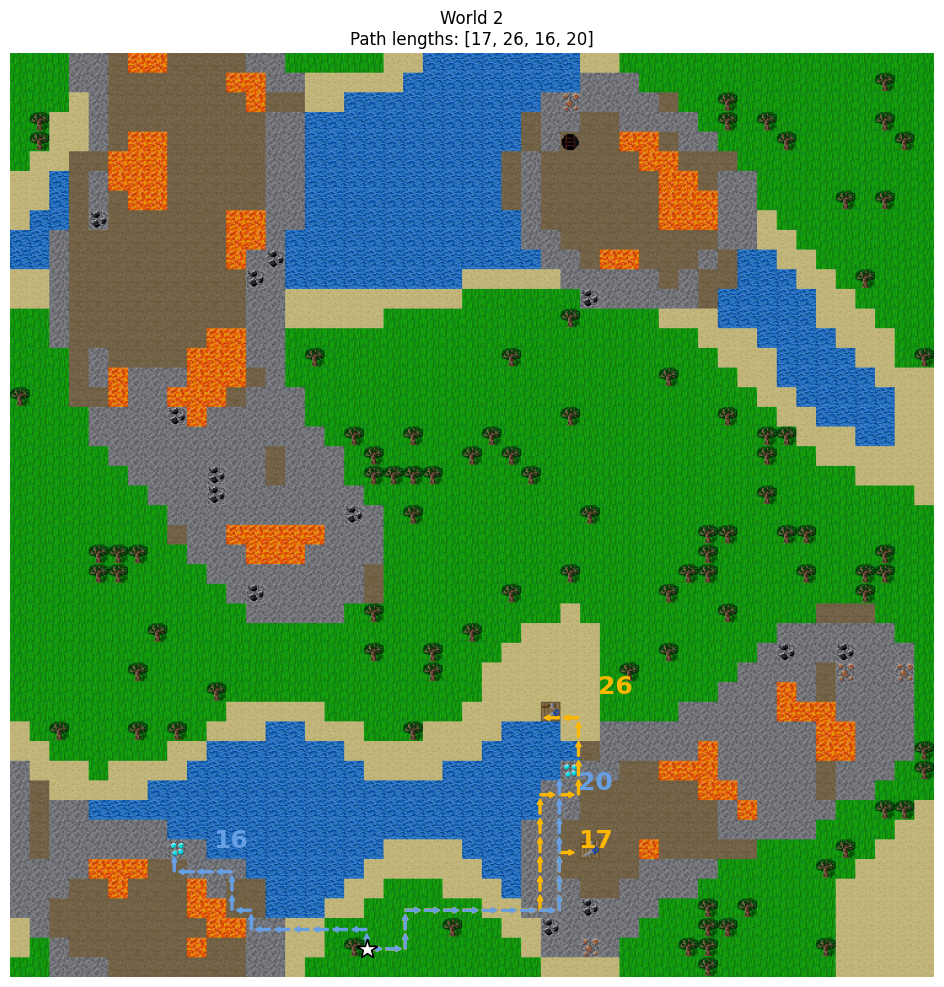

In [125]:
world_seed = 2
start_position = (46, 18)
# start_position = None
with jax.disable_jit():
  craftax_utils.train_test_paths(
    jax_env,
    params,
    world_seed,
    start_position,
    BlockType.CRAFTING_TABLE,
    BlockType.DIAMOND,
    "double",
    nearby_goal=False,
    extra_start_positions_rng=jax.random.PRNGKey(42),
    extra_start_position_center=(1, 15),
  )

In [80]:
world_seed = 13
start_position = (14, 5)
# start_position = None
with jax.disable_jit():
  craftax_utils.train_test_paths(
    jax_env,
    params,
    world_seed,
    start_position,
    BlockType.CRAFTING_TABLE,
    BlockType.DIAMOND,
    "double",
    nearby_goal=False,
    extra_start_positions_rng=jax.random.PRNGKey(42),
    extra_start_position_center=(1, 15),
  )

NameError: name 'params' is not defined

A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_16_path_(46, 26)_(18, 23).npy


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_16_path_(46, 26)_(18, 18).npy
path length: 32
path length: 37


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_16_path_(46, 26)_(21, 35).npy


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_16_path_(46, 26)_(14, 21).npy
path length: 35
path length: 38
Saved to craftax_cache/0double/world_16_paths.png


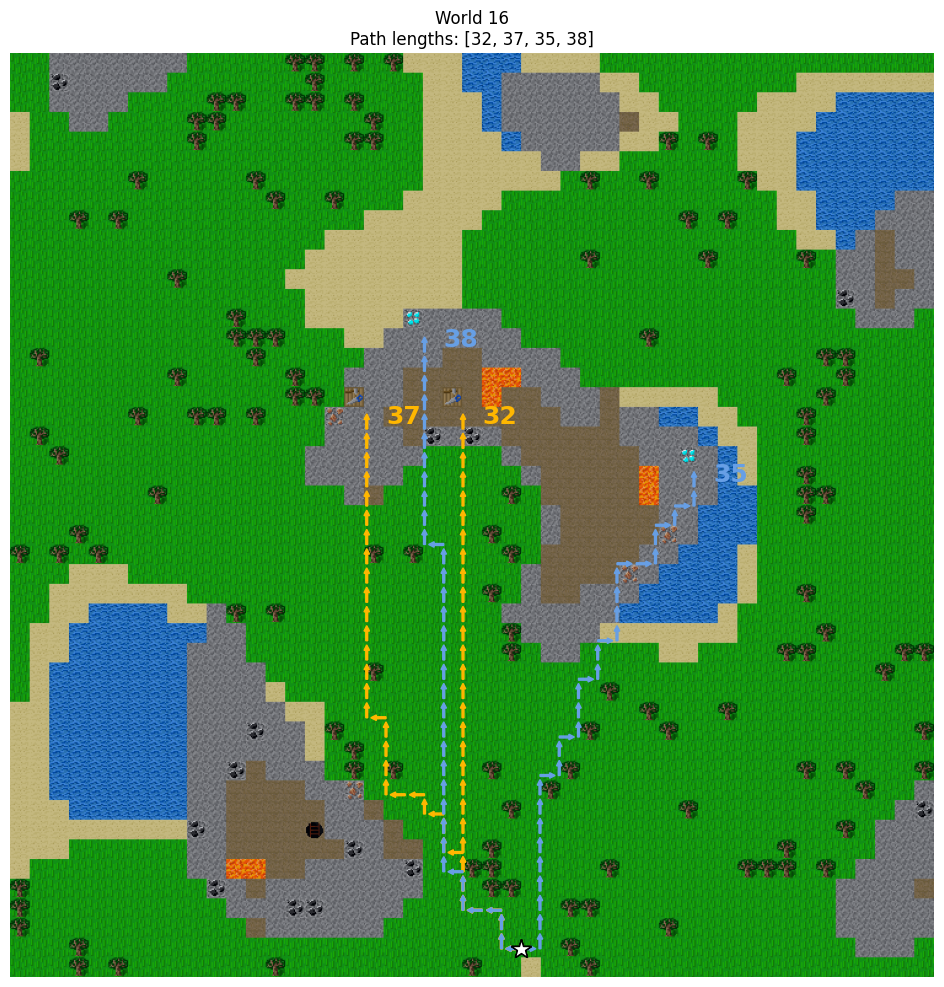

In [134]:
world_seed = 16
start_position = (46, 26)
# start_position = None
with jax.disable_jit():
  craftax_utils.train_test_paths(
    jax_env,
    params,
    world_seed,
    start_position,
    BlockType.CRAFTING_TABLE,
    BlockType.DIAMOND,
    "double",
    nearby_goal=False,
    extra_start_positions_rng=jax.random.PRNGKey(42),
    extra_start_position_center=(1, 15),
  )

A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_21_path_(25, 24)_(12, 36).npy


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_21_path_(25, 24)_(19, 43).npy
path length: 26
path length: 26


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_21_path_(25, 24)_(32, 38).npy


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_21_path_(25, 24)_(16, 39).npy
path length: 22
path length: 25
Saved to craftax_cache/0double/world_21_paths.png


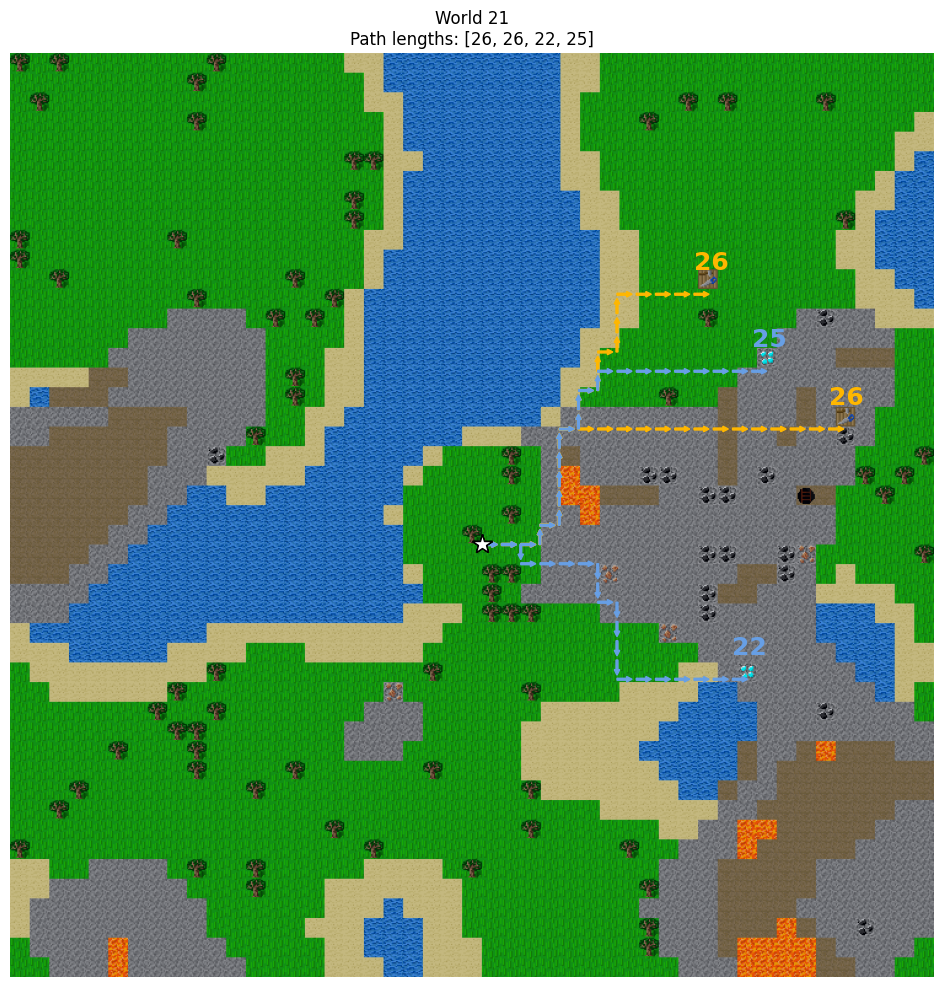

In [136]:
world_seed = 21
start_position = (25, 24)
# start_position = None
with jax.disable_jit():
  craftax_utils.train_test_paths(
    jax_env,
    params,
    world_seed,
    start_position,
    BlockType.CRAFTING_TABLE,
    BlockType.DIAMOND,
    "double",
    nearby_goal=False,
    extra_start_positions_rng=jax.random.PRNGKey(42),
    extra_start_position_center=(1, 15),
  )

A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_38_path_(38, 24)_(20, 28).npy


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_38_path_(38, 24)_(22, 36).npy
path length: 23
path length: 29


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_38_path_(38, 24)_(41, 37).npy


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_38_path_(38, 24)_(21, 33).npy
path length: 17
path length: 27
Saved to craftax_cache/0double/world_38_paths.png


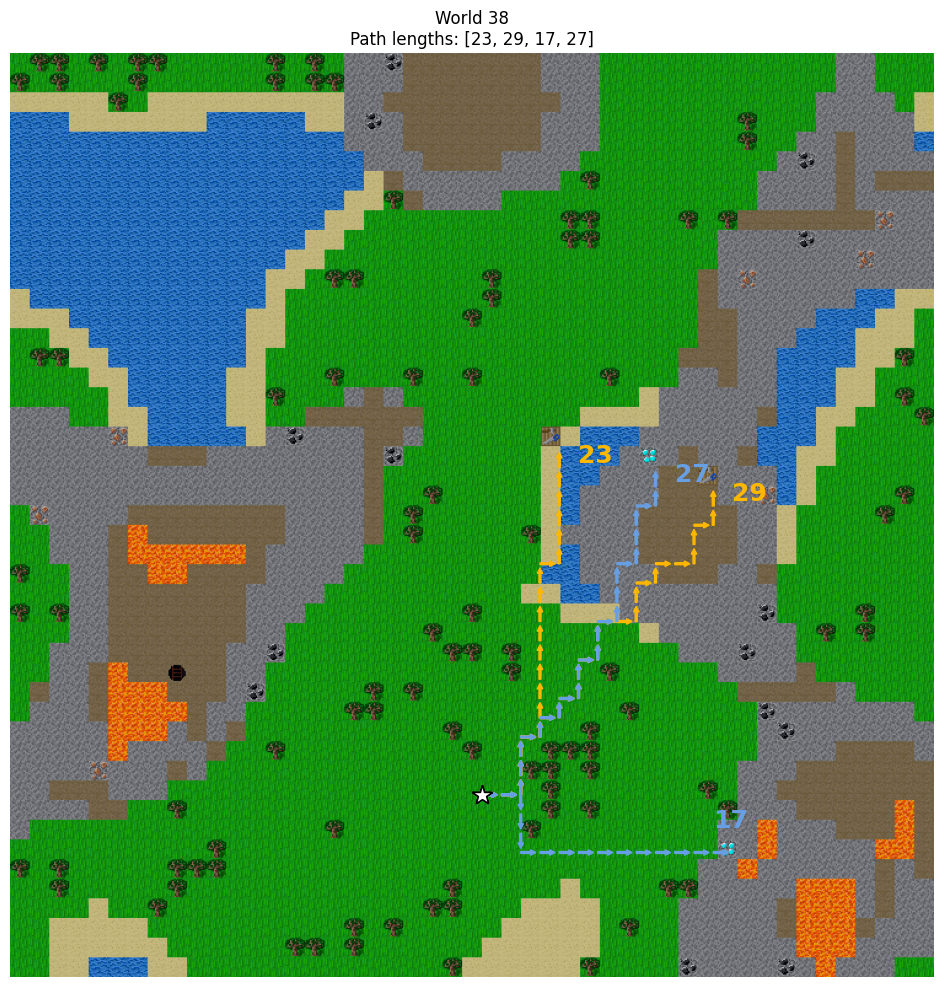

In [138]:
world_seed = 38
start_position = (38, 24)
# start_position = None
with jax.disable_jit():
  craftax_utils.train_test_paths(
    jax_env,
    params,
    world_seed,
    start_position,
    BlockType.CRAFTING_TABLE,
    BlockType.DIAMOND,
    "double",
    nearby_goal=False,
    extra_start_positions_rng=jax.random.PRNGKey(42),
    extra_start_position_center=(1, 15),
  )

A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_48_path_(26, 16)_(9, 44).npy


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_48_path_(26, 16)_(9, 46).npy
path length: 46
path length: 48


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_48_path_(26, 16)_(32, 46).npy


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/0_paths/world_48_path_(26, 16)_(8, 43).npy
path length: 37
path length: 46
Saved to craftax_cache/0double/world_48_paths.png


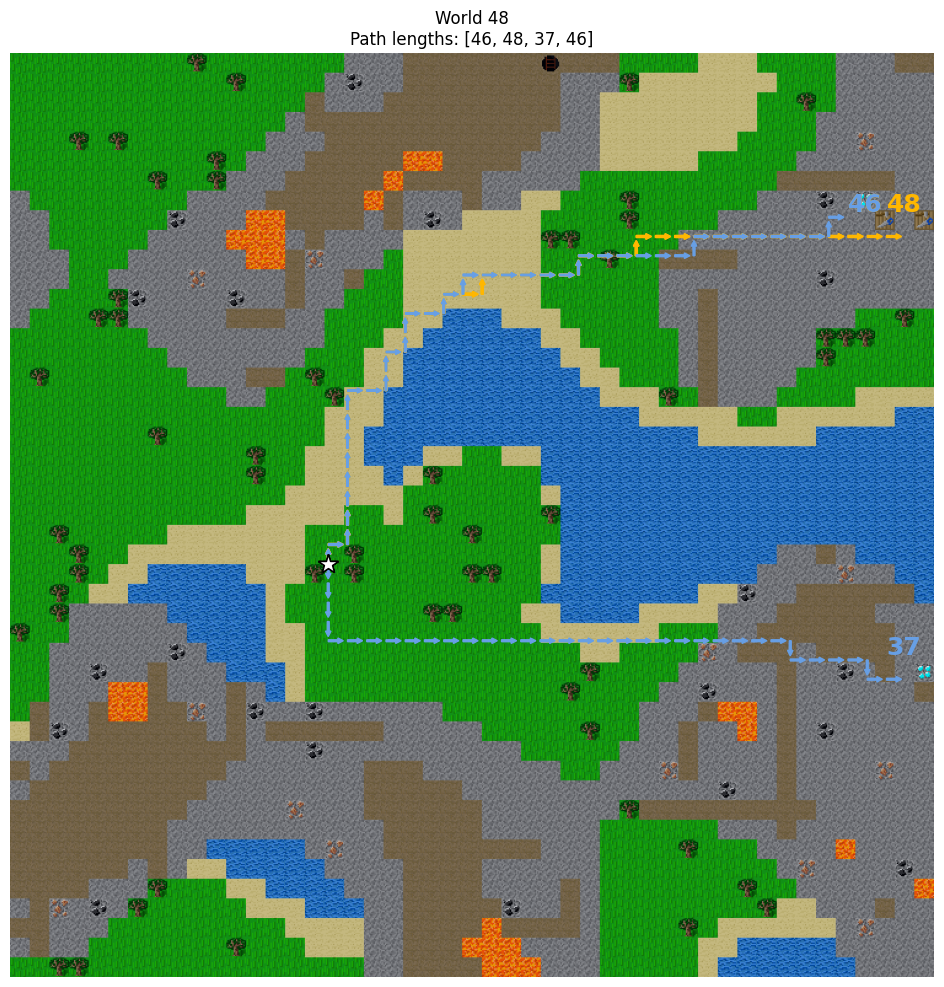

In [141]:
world_seed = 48
start_position = (26, 16)
# start_position = None
with jax.disable_jit():
  craftax_utils.train_test_paths(
    jax_env,
    params,
    world_seed,
    start_position,
    BlockType.CRAFTING_TABLE,
    BlockType.DIAMOND,
    "double",
    nearby_goal=False,
    extra_start_positions_rng=jax.random.PRNGKey(42),
    extra_start_position_center=(1, 15),
  )

# Juncture 

In [8]:
# # def juncture_testing(world_seed=1):
# key = jax.random.PRNGKey(0)
# start_position = (24, 24)
# world_seed = 1
# goal = BlockType.CRAFTING_TABLE
# params = default_params.replace(
# world_seeds=(world_seed,), always_diamond=True, start_position=start_position
# )
# obs, state = jax_env.reset(key, params)
# goal_positions = craftax_utils.get_object_positions(state, goal)[0]
# goal_positions

DIAMOND locations: [[14 24]]
CRAFTING_TABLE locations: [[19 26]
 [12 23]]
Loading path from cache: craftax_cache/paths/world_1_path_(23, 40)_(19, 26).npy
Loading path from cache: craftax_cache/paths/world_1_path_(23, 40)_(14, 24).npy
Loading path from cache: craftax_cache/paths/world_1_path_(22, 26)_(19, 26).npy
Saved to craftax_cache/juncture/world_1_paths.png


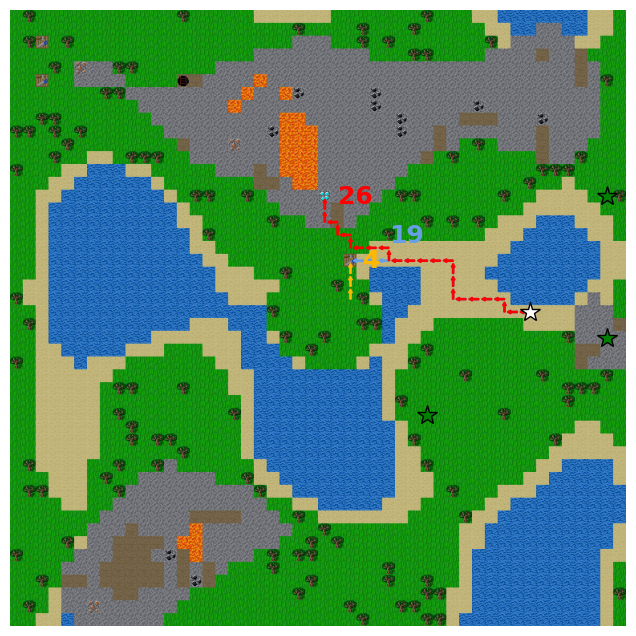

In [76]:
world_seed = 1
start_position = (23, 40)
second_start_position = (22, 26)

get_block_locations(world_seed, blocks=[BlockType.DIAMOND, BlockType.CRAFTING_TABLE])

config = craftax_experiment_configs.JUNCTURE_CONFIGS[0]

craftax_utils.train_test_paths(
  jax_env=jax_env,
  params=default_params,
  world_seed=world_seed,
  start_position=start_position,
  train_object=BlockType.DIAMOND,
  test_object=BlockType.CRAFTING_TABLE,
  train_object_location=config.train_object_location,
  test_object_location=config.test_object_location,
  prefix="juncture",
  second_start_position=second_start_position,
  goal_idx=0,
  extra_positions=config.start_train_positions,
)

DIAMOND locations: [[37 28]
 [41  8]]
CRAFTING_TABLE locations: [[34 27]
 [41 29]]
Loading path from cache: craftax_cache/paths/world_2_path_(15, 30)_(34, 27).npy
Loading path from cache: craftax_cache/paths/world_2_path_(15, 30)_(37, 28).npy
Loading path from cache: craftax_cache/paths/world_2_path_(34, 24)_(34, 27).npy
Saved to craftax_cache/juncture/world_2_paths.png


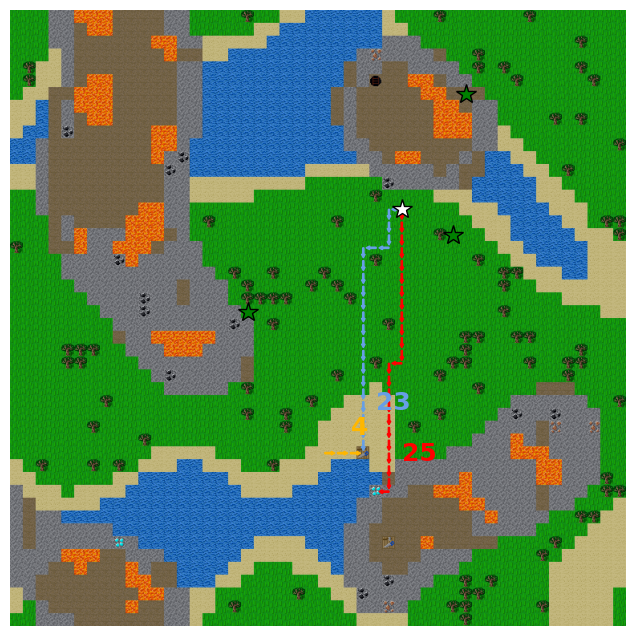

In [77]:
world_seed = 2
start_position = (15, 30)
# start_position = None
second_start_position = (34, 24)
get_block_locations(world_seed, blocks=[BlockType.DIAMOND, BlockType.CRAFTING_TABLE])

train_object_location = (41, 8)
test_object_location = (34, 27)

craftax_utils.train_test_paths(
  jax_env=jax_env,
  params=default_params,
  world_seed=world_seed,
  start_position=start_position,
  train_object=BlockType.DIAMOND,
  test_object=BlockType.CRAFTING_TABLE,
  train_object_location=train_object_location,
  test_object_location=test_object_location,
  prefix="juncture",
  second_start_position=second_start_position,
  goal_idx=0,
  extra_start_positions_rng=jax.random.PRNGKey(42),
  extra_start_position_center=(23, 44),
  extra_positions=craftax_experiment_configs.JUNCTURE_CONFIGS[1].start_train_positions,
)

DIAMOND locations: [[14 21]
 [21 35]]
CRAFTING_TABLE locations: [[18 23]
 [18 18]]
Loading path from cache: craftax_cache/paths/world_16_path_(24, 21)_(18, 18).npy
Loading path from cache: craftax_cache/paths/world_16_path_(24, 21)_(14, 21).npy
Loading path from cache: craftax_cache/paths/world_16_path_(15, 18)_(18, 18).npy
Saved to craftax_cache/juncture/world_16_paths.png


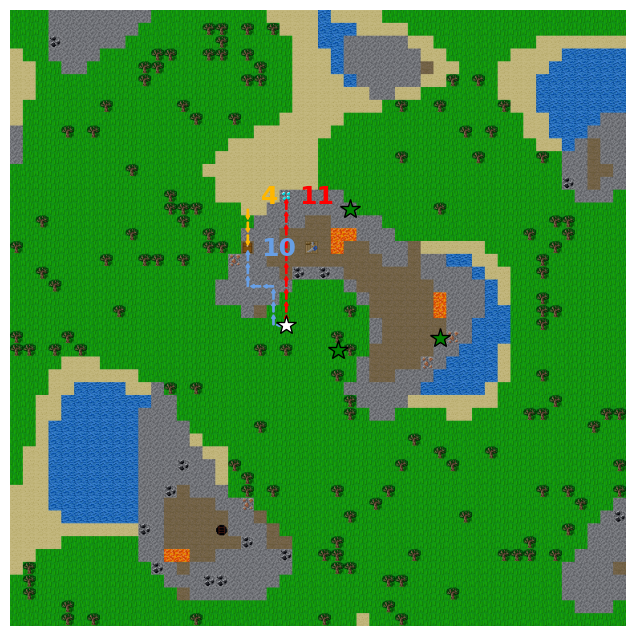

In [81]:
world_seed = 16
start_position = (24, 21)
# start_position = None
second_start_position = (15, 18)
get_block_locations(world_seed, blocks=[BlockType.DIAMOND, BlockType.CRAFTING_TABLE])

config = craftax_experiment_configs.JUNCTURE_CONFIGS[2]

craftax_utils.train_test_paths(
  jax_env=jax_env,
  params=default_params,
  world_seed=world_seed,
  start_position=start_position,
  train_object=BlockType(config.train_objects[0]),
  test_object=BlockType(config.test_objects[0]),
  train_object_location=config.train_object_location,
  test_object_location=config.test_object_location,
  prefix="juncture",
  second_start_position=second_start_position,
  goal_idx=0,
  extra_positions=config.start_train_positions,
)

DIAMOND locations: [[32 38]
 [16 39]]
CRAFTING_TABLE locations: [[12 36]
 [19 43]]
Loading path from cache: craftax_cache/paths/world_21_path_(5, 43)_(12, 36).npy


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/paths/world_21_path_(5, 43)_(32, 38).npy
Loading path from cache: craftax_cache/paths/world_21_path_(12, 32)_(12, 36).npy
Saved to craftax_cache/juncture/world_21_paths.png


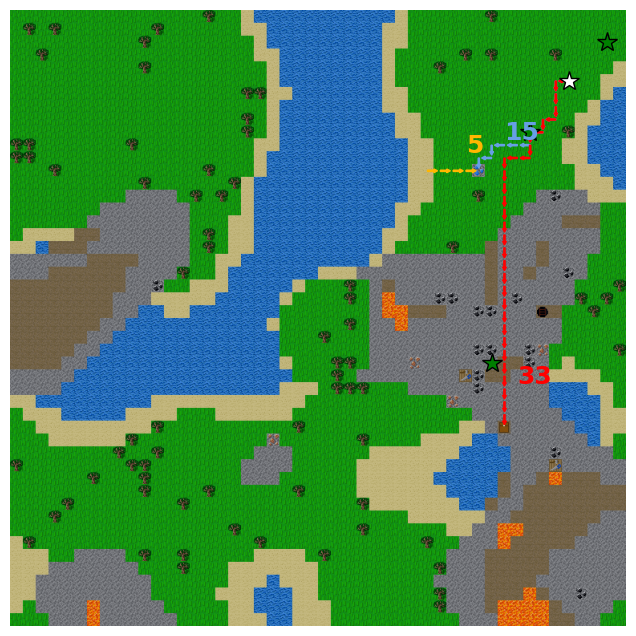

In [85]:
world_seed = 21
start_position = (5, 43)
# start_position = None
second_start_position = (12, 32)
get_block_locations(world_seed, blocks=[BlockType.DIAMOND, BlockType.CRAFTING_TABLE])

config = craftax_experiment_configs.JUNCTURE_CONFIGS[3]

craftax_utils.train_test_paths(
  jax_env=jax_env,
  params=default_params,
  world_seed=world_seed,
  start_position=start_position,
  train_object=BlockType(config.train_objects[0]),
  test_object=BlockType(config.test_objects[0]),
  train_object_location=config.train_object_location,
  test_object_location=config.test_object_location,
  prefix="juncture",
  second_start_position=second_start_position,
  goal_idx=0,
  extra_positions=config.start_train_positions,
)

Loading path from cache: craftax_cache/path_(40, 30)_(18, 23).npy
Loading path from cache: craftax_cache/path_(40, 30)_(18, 18).npy
Loading path from cache: craftax_cache/path_(40, 30)_(21, 35).npy
Loading path from cache: craftax_cache/path_(40, 30)_(14, 21).npy


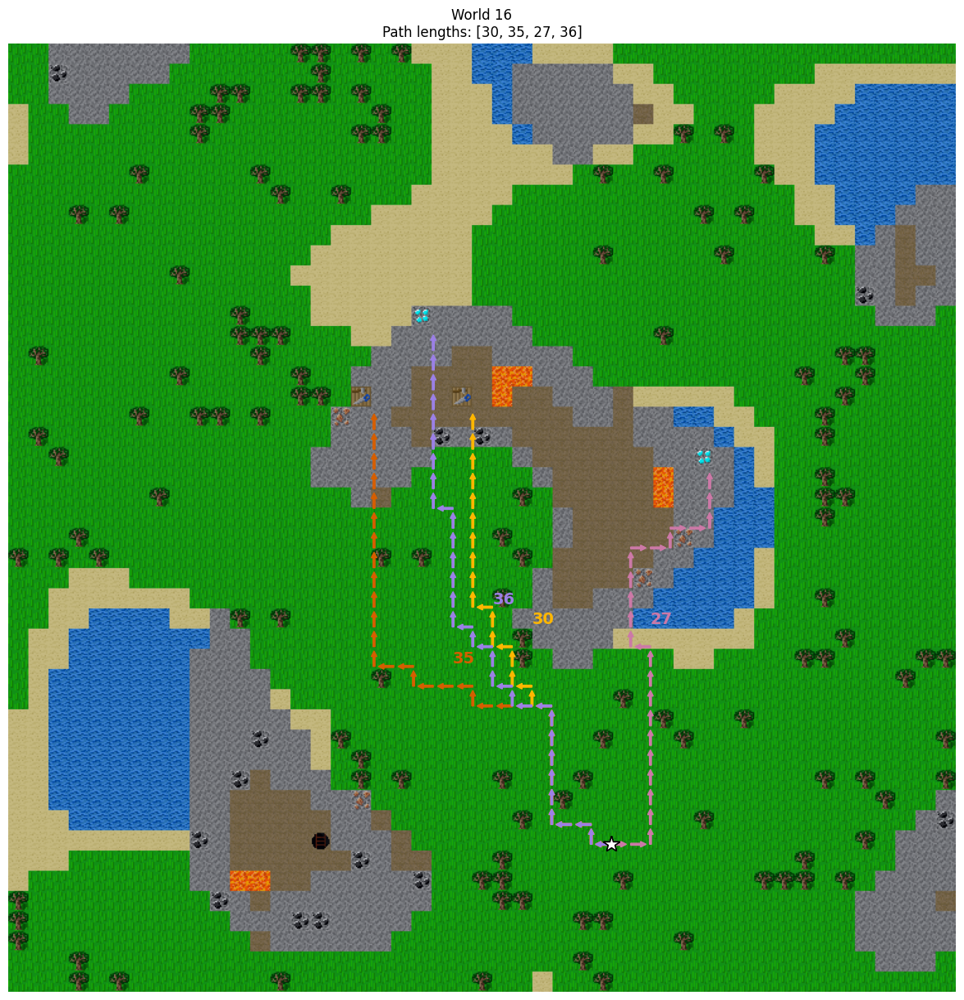

In [46]:
world_seed = 16
# start_position=(22, 25)
start_position = (40, 30)

params = default_params.replace(
  world_seeds=(world_seed,), always_diamond=True, start_position=start_position
)
obs, state = jax_env.reset(key, params)


train_object = BlockType.CRAFTING_TABLE
test_object = BlockType.DIAMOND

# train_object = BlockType.DIAMOND
# test_object = BlockType.CRAFTING_TABLE

train_position = craftax_utils.get_object_positions(state, train_object)[0]
with jax.disable_jit():
  craftax_utils.display_map_with_paths(
    state,
    [
      train_object,
      test_object,
    ],
    params,
    # paths_nearby=train_position,
    display_paths=True,
  )
  plt.show()

A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/path_(26, 22)_(12, 36).npy


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/path_(26, 22)_(19, 43).npy


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/path_(26, 22)_(32, 38).npy


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/path_(26, 22)_(16, 39).npy


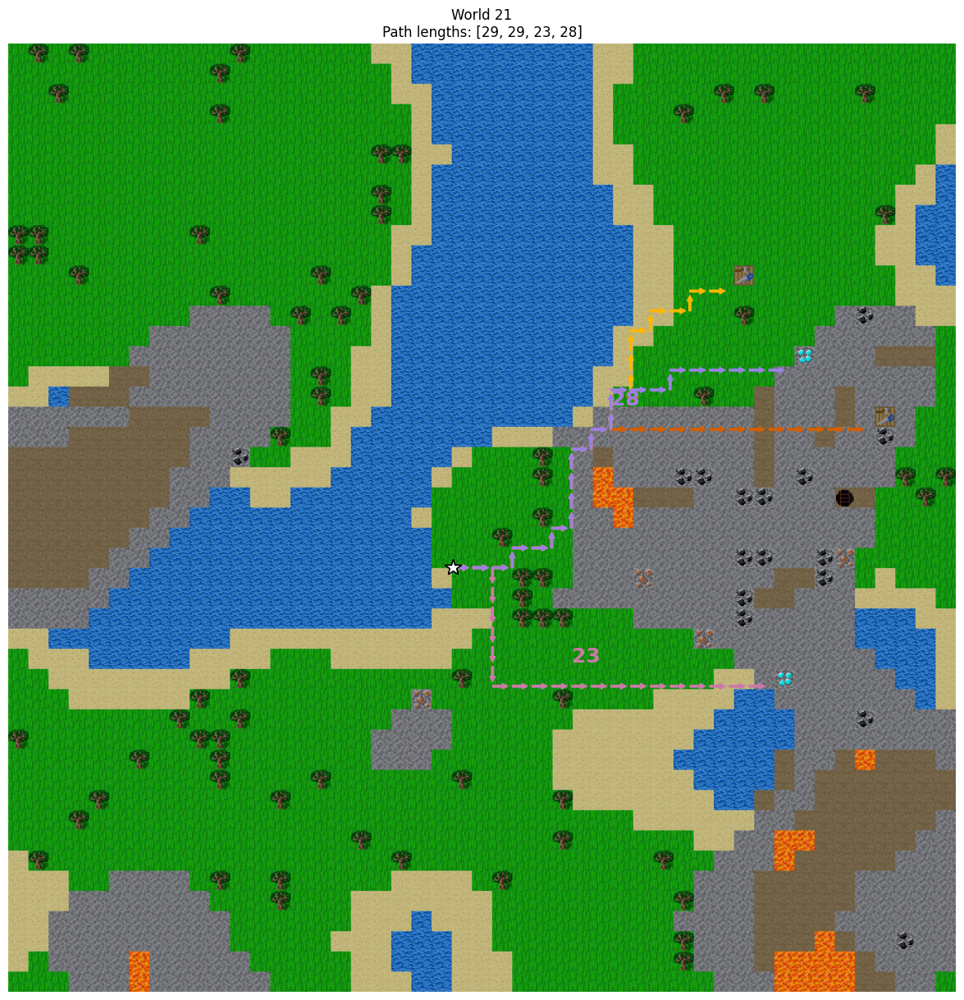

In [55]:
world_seed = 21
# start_position=(22, 25)
start_position = (26, 22)

params = default_params.replace(
  world_seeds=(world_seed,), always_diamond=True, start_position=start_position
)
obs, state = jax_env.reset(key, params)


train_object = BlockType.CRAFTING_TABLE
test_object = BlockType.DIAMOND

# train_object = BlockType.DIAMOND
# test_object = BlockType.CRAFTING_TABLE

train_position = craftax_utils.get_object_positions(state, train_object)[0]
with jax.disable_jit():
  craftax_utils.display_map_with_paths(
    state,
    [
      train_object,
      test_object,
    ],
    params,
    # paths_nearby=train_position,
    display_paths=True,
  )
  plt.show()

A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/world_22_path_(2, 2)_(5, 39).npy


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/world_22_path_(2, 2)_(11, 45).npy
path length: 41
path length: 53


A* Iterations: 0it [00:00, ?it/s]

Saving path to cache: craftax_cache/world_22_path_(2, 2)_(9, 43).npy
path length: 49


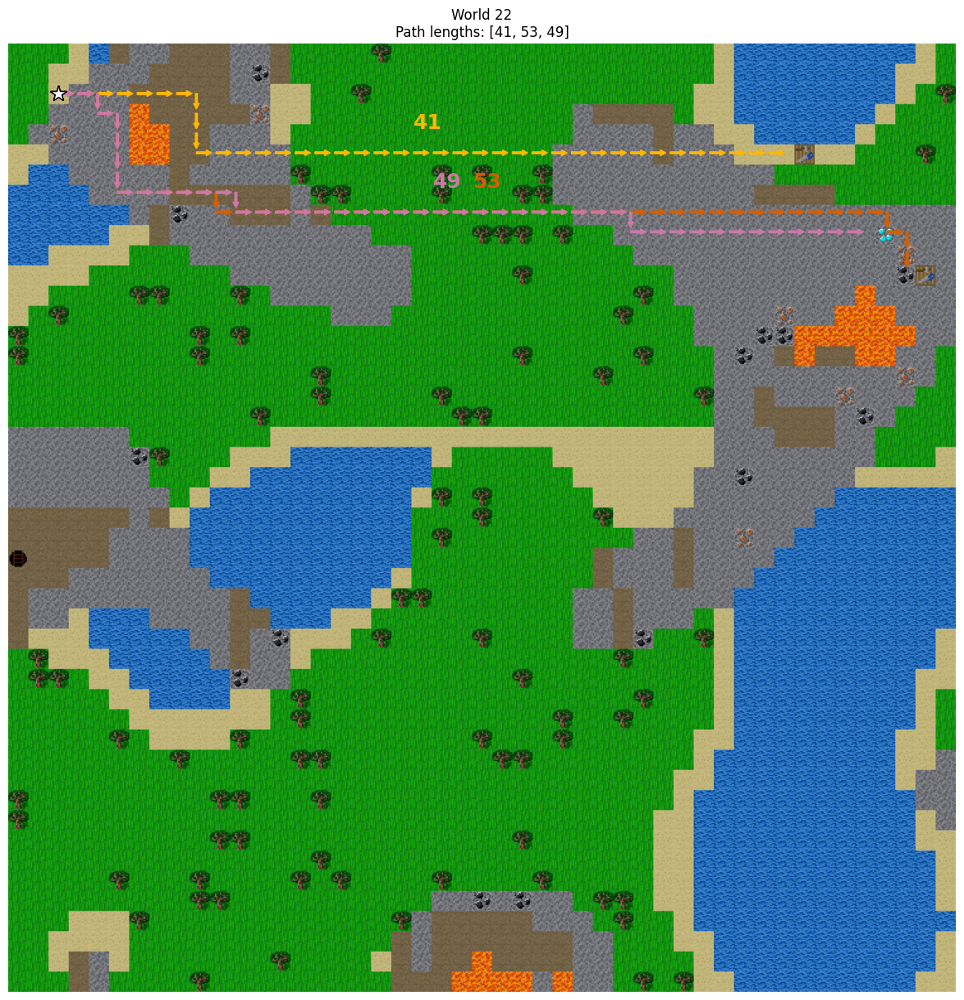

In [69]:
world_seed = 22
# start_position=(22, 25)
# start_position = (25, 34)
start_position = (2, 2)

params = default_params.replace(
  world_seeds=(world_seed,), always_diamond=True, start_position=start_position
)
obs, state = jax_env.reset(key, params)


train_object = BlockType.CRAFTING_TABLE
test_object = BlockType.DIAMOND

# train_object = BlockType.DIAMOND
# test_object = BlockType.CRAFTING_TABLE

train_position = craftax_utils.get_object_positions(state, train_object)[0]
with jax.disable_jit():
  craftax_utils.display_map(
    state=state,
    goals=[
      train_object,
      test_object,
    ],
    params=params,
    # paths_nearby=train_position,
    show_agent=False,
    display_paths=True,
  )
  plt.show()